# Audio anomaly detection with audio embeddings and Azure Cognitive Search

- We can use audio embeddings to find anomalies in audio files
- We are going to use here Azure Cognitive Search and its new vector store. 
- Audio embeddings are made with PANNS: Large-Scale Pretrained Audio Neural Networks

In [1]:
# %pip install datasets
# %pip install panns_inference

In [2]:
import emoji
import glob
import json
import librosa
import matplotlib.pyplot as plt
import numpy as np
import os
import os.path
import pandas as pd
import requests
import sys
import time

from azure.core.credentials import AzureKeyCredential

from azure.search.documents.models import Vector
from azure.search.documents import SearchClient
from azure.search.documents.indexes import SearchIndexClient
from azure.search.documents.indexes.models import (
    PrioritizedFields,
    SearchableField,
    SearchField,
    SearchFieldDataType,
    SearchIndex,
    SemanticConfiguration,
    SemanticField,
    SemanticSettings,
    SimpleField,
    VectorSearch,
    VectorSearchAlgorithmConfiguration,
)

from IPython.display import Audio, display
from panns_inference import AudioTagging

In [3]:
sys.version

'3.10.10 (main, Mar 21 2023, 18:45:11) [GCC 11.2.0]'

In [4]:
# Azure Cognitive Search
acs_endpoint = "YOUR_ENDPOINT"
acs_key = "YOUR_KEY"

acs_cred = AzureKeyCredential(acs_key)

# Azure Cognitive Search index name to create
index_name = "azure-audioanomaly-embeddings-demo"

# Azure Cognitive Search api version for vectors
api_version = "2023-02-01-preview"

## 1. Sounds dataset

In [5]:
AUDIO_DIR = "audio"

ANOMALY_DIR = AUDIO_DIR + "/train/anomaly"
OK_DIR = AUDIO_DIR + "/train/no_anomaly"

ANOMALY_SOUNDS = glob.glob(os.path.join(ANOMALY_DIR, "*.wav"))
OK_SOUNDS = glob.glob(os.path.join(OK_DIR, "*.wav"))

In [6]:
print("Number of sounds with anomalies =", len(ANOMALY_SOUNDS))
print("Number of sounds without anomalies =", len(OK_SOUNDS))

Number of sounds with anomalies = 58
Number of sounds without anomalies = 58


## 2. Functions

In [7]:
def get_audio_metadata(audio_file):
    """
    Audio metadata generation from an audio file
    """
    import audio_metadata

    audiofilemetadata = audio_metadata.load(audio_file)

    audio_format = audiofilemetadata.streaminfo.audio_format
    bit_depth = audiofilemetadata.streaminfo.bit_depth
    bitrate = audiofilemetadata.streaminfo.bitrate
    nb_channels = audiofilemetadata.streaminfo.channels
    duration = audiofilemetadata.streaminfo.duration
    sample_rate = audiofilemetadata.streaminfo.sample_rate
    audio_filesize = audiofilemetadata.filesize

    last_modified_date = time.ctime(os.path.getmtime(audio_file))
    creation_date = time.ctime(os.path.getctime(audio_file))

    print("\n", "-" * 20, "Audio Statistics", "-" * 20, "\n")
    print("Audio File:\t", audio_file)
    print("Modified Date:\t", last_modified_date)
    print("Creation Date:\t", creation_date)
    print("File Size:\t", audio_filesize)
    print("Audio Format:\t", audio_format)
    print("Bit Depth:\t", bit_depth)
    print("Bit Rate:\t", bitrate)
    print("Sampling Rate:\t", sample_rate)
    print("Nb of Channels:\t", nb_channels)
    print("Duration:\t", duration)

In [8]:
def display_amplitude(audio_file):
    """
    Get amplitude plot from a local audio file
    """
    plt.figure(figsize=(15, 5))
    # Reading the sound file
    y, sr = librosa.load(audio_file)
    # amplitude plot
    librosa.display.waveshow(y, sr=sr)
    title = "Waveplot: " + audio_file
    plt.title(title, fontdict=dict(size=15))
    plt.xlabel("Time", fontdict=dict(size=12))
    plt.ylabel("Amplitude", fontdict=dict(size=12))

    plt.show()

In [9]:
def display_fft(audio_file):
    """
    Get FFT plot from a local audio file
    """
    plt.figure(figsize=(15, 5))

    # Reading the audio file
    y, sr = librosa.load(audio_file)
    # Creating a Discrete-Fourier Transform with our FFT algorithm
    fast_fourier_transf = np.fft.fft(y)
    # Magnitudes indicate the contribution of each frequency
    magnitude = np.abs(fast_fourier_transf)
    # mapping the magnitude to the relative frequency bins
    frequency = np.linspace(0, sr, len(magnitude))
    # We only need the first half of the magnitude and frequency
    left_mag = magnitude[: int(len(magnitude) / 2)]
    left_freq = frequency[: int(len(frequency) / 2)]

    title = "Discrete-Fourier Transform: " + audio_file
    plt.plot(left_freq, left_mag)
    plt.title(title, fontdict=dict(size=15))
    plt.xlabel("Frequency", fontdict=dict(size=12))
    plt.ylabel("Magnitude", fontdict=dict(size=12))

    plt.show()

In [10]:
def display_mel_spectogram(audio_file, n_fft=1024, hop_length=512):
    """
    Get MEL spectogram from a local audio file
    """
    plt.figure(figsize=(15, 5))

    # n_fft: this is the number of samples in a window per fft
    # hop_length: The amount of samples we are shifting after each fft

    # reading audio file
    y, sr = librosa.load(audio_file)
    # mel spectogram
    mel_signal = librosa.feature.melspectrogram(
        y=y, sr=sr, hop_length=hop_length, n_fft=n_fft
    )
    spectrogram = np.abs(mel_signal)
    power_to_db = librosa.power_to_db(spectrogram, ref=np.max)
    librosa.display.specshow(
        power_to_db,
        sr=sr,
        x_axis="time",
        y_axis="mel",
        cmap="magma",
        hop_length=hop_length,
    )

    title = "Mel-Spectogram (dB): " + audio_file
    plt.title(title, fontdict=dict(size=15))
    plt.xlabel("Time", fontdict=dict(size=12))
    plt.ylabel("Frequency", fontdict=dict(size=12))
    plt.colorbar(label="dB")

    plt.show()

In [11]:
def display_chromagram(audio_file):
    """
    Get chromagram from a local audio file
    """
    plt.figure(figsize=(15, 5))

    # reading audio file
    y, sr = librosa.load(audio_file)
    # Chromagram
    chromagram = librosa.feature.chroma_stft(y=y, sr=sr)
    librosa.display.specshow(chromagram, x_axis="time", y_axis="chroma", cmap="magma")
    plt.colorbar(format="%+2.0f dB")
    title = "Chromagram: " + audio_file
    plt.title(title)
    plt.show()

In [12]:
def get_sound_embedding(audio_file):
    """
    Get sound embedding from a numpy array audio file using panns_inference
    """
    (audio, _) = librosa.core.load(audio_file, sr=44100, mono=True)
    _, emb = model.inference(audio[None, :])

    return emb

In [13]:
def delete_index(index_name):
    """
    Deleting an Azure Cognitive Search index
    """
    start = time.time()
    search_client = SearchIndexClient(endpoint=acs_endpoint, credential=acs_cred)
    print("Deleting the Azure Cognitive Search index:", index_name)
    search_client.delete_index(index_name)
    print("Done. Elapsed time:", round(time.time() - start, 2), "secs")

In [14]:
def loading_documents(documents):
    """
    Loading documents into the Azure Cognitive Search index
    """
    # Upload some documents to the index
    print("Uploading the documents into the index", index_name, "...")
    # Setting the Azure Cognitive Search client
    search_client = SearchClient(
        endpoint=acs_endpoint, index_name=index_name, credential=acs_cred
    )
    # response = search_client.upload_documents(documents)  # print all
    search_client.upload_documents(documents)

    print(
        f"\nDone. Uploaded {len(documents)} documents into the Azure Cognitive Search index.\n"
    )
    return len(documents)

In [15]:
def index_stats(index_name):
    """
    Get statistics about Azure Cognitive Search index
    """
    url = (
        acs_endpoint
        + "/indexes/"
        + index_name
        + "/stats?api-version=2021-04-30-Preview"
    )

    headers = {
        "Content-Type": "application/json",
        "api-key": acs_key,
    }

    response = requests.get(url, headers=headers)
    print("Azure Cognitive Search index status for:", index_name)
    print("\033[1;31;34m")

    if response.status_code == 200:
        res = response.json()
        print(json.dumps(res, indent=2))
        document_count = res["documentCount"]
        storage_size = res["storageSize"]

    else:
        print("Request failed with status code:", response.status_code)

    return document_count, storage_size

In [16]:
def index_status(index_name):
    """
    Azure Cognitive Search index status
    """
    print("Azure Cognitive Search Index:", index_name, "\n")

    headers = {"Content-Type": "application/json", "api-key": acs_key}
    params = {"api-version": "2021-04-30-Preview"}
    index_status = requests.get(
        acs_endpoint + "/indexes/" + index_name, headers=headers, params=params
    )

    try:
        print("\033[1;31;34m")
        print(json.dumps((index_status.json()), indent=5))

    except:
        print("\033[1;31;91m")
        print("Request failed")

In [17]:
def find_similar_sound(audio_file, topn=10):
    """
    Find similar sound using Azure Cognitive Search
    """
    start = time.time()

    topnlist = []
    topncat = []

    emb = np.squeeze(get_sound_embedding(audio_file))

    # Initialize the Azure Cognitive Search client
    search_client = SearchClient(acs_endpoint, index_name, acs_cred)

    # Perform vector search
    response = search_client.search(
        search_text="",
        vector=Vector(value=emb, k=topn, fields="audio_embeddings"),
        select=["audio_filename", "audio_category"],
    )

    print(
        "Finding similar audio file of",
        audio_file,
        "using audio embeddings and Azure Cognitive Search",
    )
    print("\033[1;31;34m")

    for nb, result in enumerate(response, 1):
        audio_filename = result["audio_filename"]
        audio_category = result["audio_category"]
        score = result["@search.score"]

        print(
            f"\033[1;31;34mTop {nb:02}: {audio_filename:50} | category: {audio_category:15} | score = {score}"
        )
        topnlist.append(audio_filename)
        topncat.append(audio_category)

    # Most common value category
    mcv = max(set(topncat), key=topncat.count)

    if mcv == "no_anomaly":
        print(
            "\n\033[1;31;32m", emoji.emojize(":thumbs_up:"), "Prediction (most common value) =",
            max(set(topncat), key=topncat.count),
        )
        print("\nNo sound anomaly in", audio_file)
    
    else:
        print(
            "\n\033[1;31;91m", emoji.emojize(":fire:"), "Prediction (most common value) =",
            max(set(topncat), key=topncat.count),
        )
        print("\nSound anomaly detected in", audio_file, "!")

    print("\n\033[0mDone in", round(time.time() - start, 5), "seconds")

    return topnlist

## 3. Some audio files

In [18]:
sample1 = ANOMALY_SOUNDS[0]
sample2 = OK_SOUNDS[0]

In [19]:
Audio(sample1)

In [20]:
%%javascript

IPython.OutputArea.auto_scroll_threshold = 9999

<IPython.core.display.Javascript object>


 -------------------- Audio Statistics -------------------- 

Audio File:	 audio/train/anomaly/machine_sound_100.wav
Modified Date:	 Mon Jul 17 17:48:46 2023
Creation Date:	 Tue Jul 18 08:11:13 2023
File Size:	 1234844
Audio Format:	 WAVEAudioFormat.PCM
Bit Depth:	 16
Bit Rate:	 1411200
Sampling Rate:	 44100
Nb of Channels:	 2
Duration:	 7.0


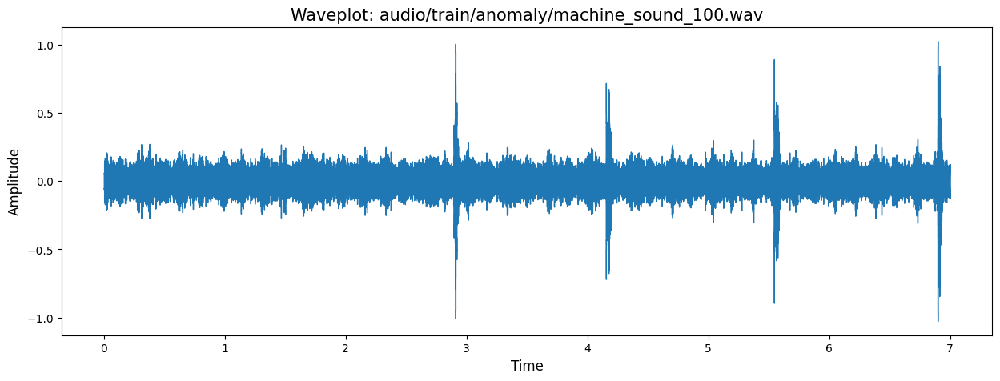

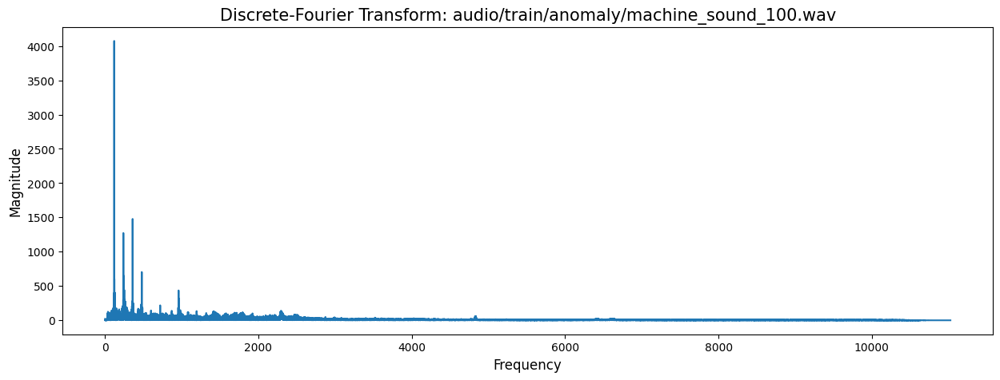

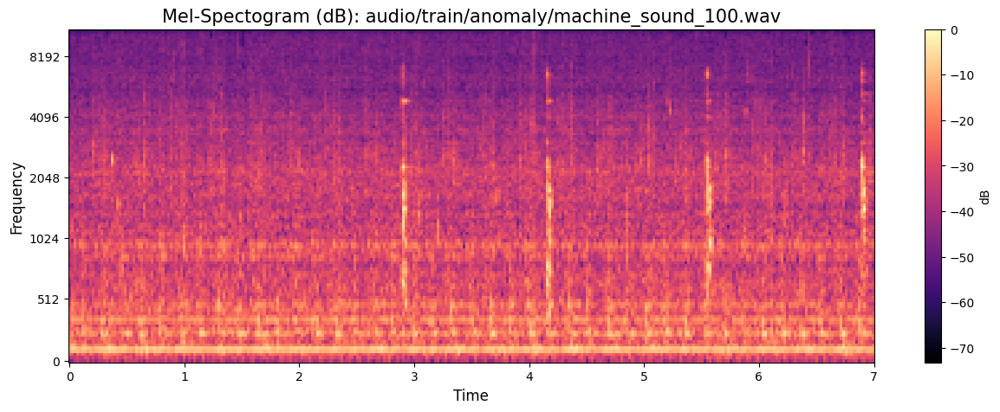

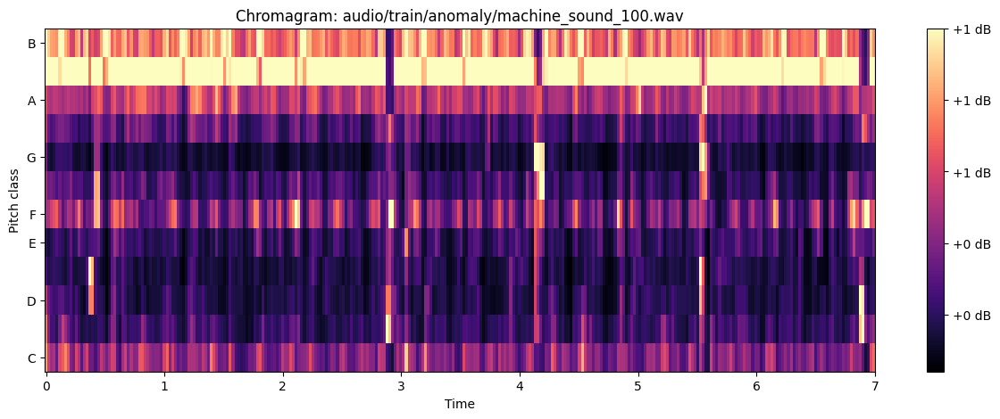

In [21]:
get_audio_metadata(sample1)
display_amplitude(sample1)
display_fft(sample1)
display_mel_spectogram(sample1)
display_chromagram(sample1)

> We can see that anomalies can be seen in the spectogram plot (vertical lines in 3, 4 and 5,5 secs)

In [22]:
Audio(sample2)


 -------------------- Audio Statistics -------------------- 

Audio File:	 audio/train/no_anomaly/machine_sound_01.wav
Modified Date:	 Mon Jul 17 17:49:18 2023
Creation Date:	 Tue Jul 18 08:11:20 2023
File Size:	 1234844
Audio Format:	 WAVEAudioFormat.PCM
Bit Depth:	 16
Bit Rate:	 1411200
Sampling Rate:	 44100
Nb of Channels:	 2
Duration:	 7.0


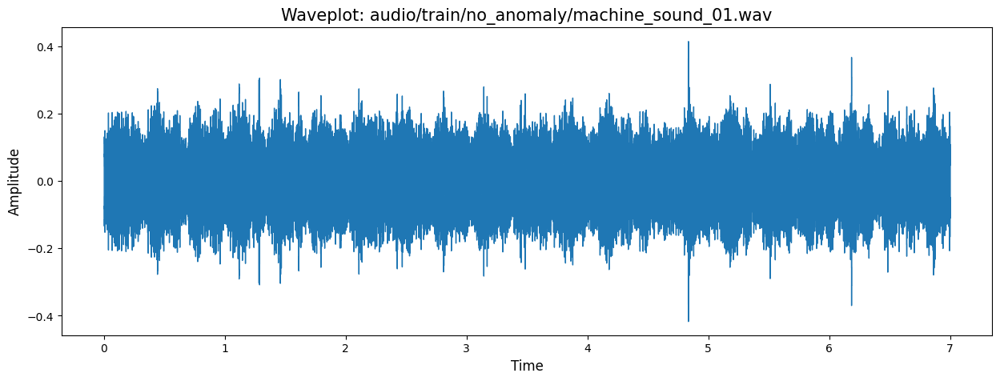

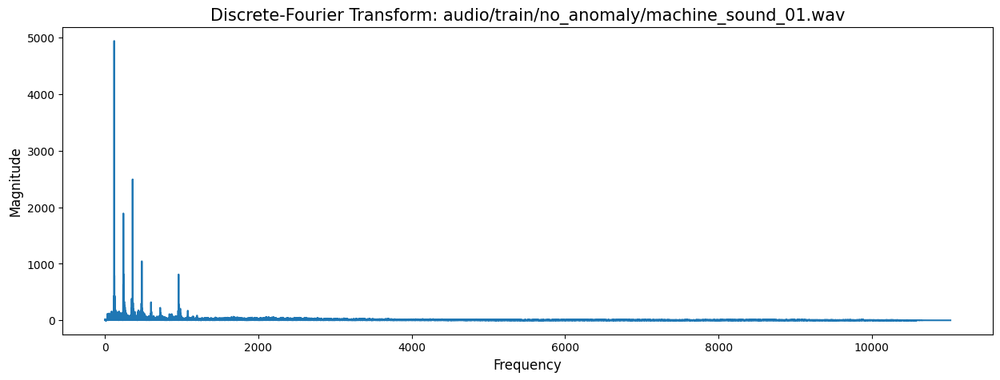

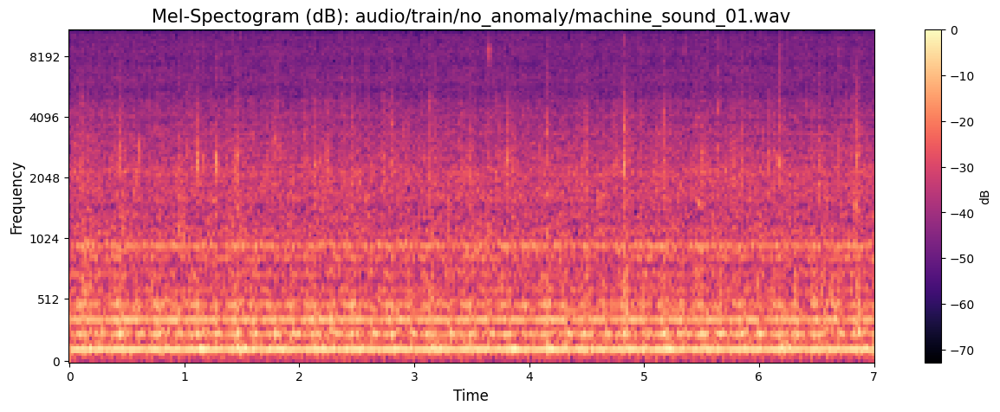

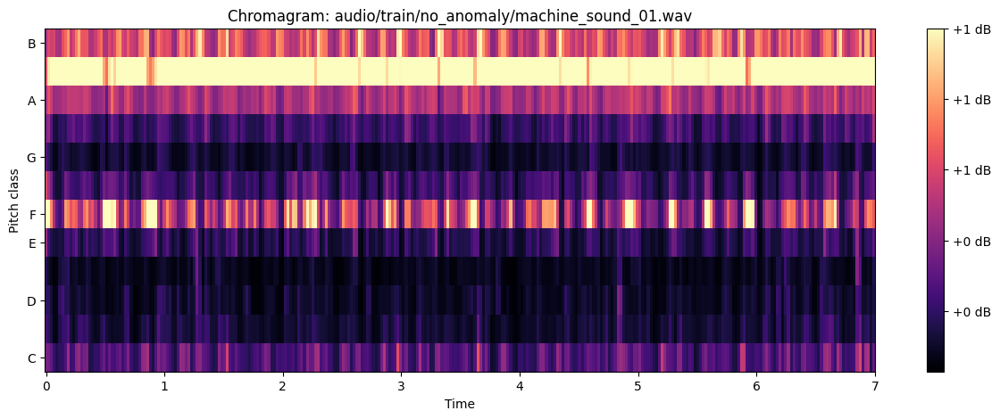

In [23]:
get_audio_metadata(sample2)
display_amplitude(sample2)
display_fft(sample2)
display_mel_spectogram(sample2)
display_chromagram(sample2)

### Audio embedding model

In [24]:
model = AudioTagging(
    checkpoint_path=None,
    device="cpu",
)
# change device to cpu or gpu

Checkpoint path: /home/azureuser/panns_data/Cnn14_mAP=0.431.pth
Using CPU.


## 4. Audio Catalog

In [25]:
def generate_dataframe(directory, category):
    """ Function to generate DataFrame
    """
    file_list = os.listdir(directory)
    file_paths = [
        os.path.join(directory, file) for file in file_list if file.endswith(".wav")
    ]
    df = pd.DataFrame({"audio_filename": file_paths, "audio_category": category})

    return df

In [26]:
ok_df = generate_dataframe(OK_DIR, os.path.basename(OK_DIR))
ko_df = generate_dataframe(ANOMALY_DIR, os.path.basename(ANOMALY_DIR))

audio_catalog_df = pd.concat([ok_df, ko_df], ignore_index=True)
audio_catalog_df

,audio_filename,audio_category
0,audio/train/no_anomaly/machine_sound_01.wav,no_anomaly
1,audio/train/no_anomaly/machine_sound_02.wav,no_anomaly
2,audio/train/no_anomaly/machine_sound_03.wav,no_anomaly
3,audio/train/no_anomaly/machine_sound_04.wav,no_anomaly
4,audio/train/no_anomaly/machine_sound_05.wav,no_anomaly
...,...,...
111,audio/train/anomaly/machine_sound_153.wav,anomaly
112,audio/train/anomaly/machine_sound_154.wav,anomaly
113,audio/train/anomaly/machine_sound_155.wav,anomaly
114,audio/train/anomaly/machine_sound_156.wav,anomaly


In [27]:
del ok_df, ko_df

In [28]:
audio_catalog_df.shape

(116, 2)

<Axes: xlabel='audio_category'>

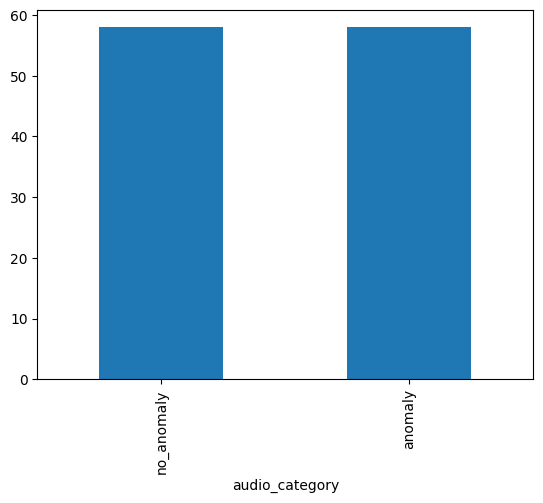

In [29]:
audio_catalog_df["audio_category"].value_counts(sort=True).plot.bar()

## 5. Running the embeddings on each audio array

In [30]:
start = time.time()

print("Running the embeddings on all the audio files...")

# Applying the embedding function to the df
audio_catalog_df["audio_embeddings"] = audio_catalog_df["audio_filename"].apply(
    get_sound_embedding
)

print("Done")
elapsed = time.time() - start
print(
    "Elapsed time: "
    + time.strftime(
        "%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)
    )
)

Running the embeddings on all the audio files...
Done
Elapsed time: 00:00:17.785707


In [31]:
audio_catalog_df

,audio_filename,audio_category,audio_embeddings
0,audio/train/no_anomaly/machine_sound_01.wav,no_anomaly,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
1,audio/train/no_anomaly/machine_sound_02.wav,no_anomaly,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
2,audio/train/no_anomaly/machine_sound_03.wav,no_anomaly,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
3,audio/train/no_anomaly/machine_sound_04.wav,no_anomaly,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
4,audio/train/no_anomaly/machine_sound_05.wav,no_anomaly,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
...,...,...,...
111,audio/train/anomaly/machine_sound_153.wav,anomaly,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
112,audio/train/anomaly/machine_sound_154.wav,anomaly,"[[0.0, 0.12269734, 0.0, 0.0, 0.0, 0.0, 0.0, 0...."
113,audio/train/anomaly/machine_sound_155.wav,anomaly,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
114,audio/train/anomaly/machine_sound_156.wav,anomaly,"[[0.0, 0.36061755, 0.0, 0.0, 0.0, 0.0, 0.0, 0...."


In [32]:
audio_catalog_df.shape

(116, 3)

## 6. Azure Cognitive Search

In [33]:
# Deleting any existing index name
delete_index(index_name)

Deleting the Azure Cognitive Search index: azure-audioanomaly-embeddings-demo
Done. Elapsed time: 0.39 secs


### Index definition

In [34]:
emb_length = 2048  # Dimension of the audio embeddings

In [35]:
try:
    # Setting the Azure Cognitive Search client
    print("Setting the Azure Cognitive Search client")
    search_client = SearchIndexClient(endpoint=acs_endpoint, credential=acs_cred)
    print("Done")
    print(search_client)

except:
    print("Request failed. Cannot create Azure Cognitive Search client:", acs_endpoint)

Setting the Azure Cognitive Search client
Done


In [36]:
start = time.time()

# Fields definition
fields = [
    # Sound id
    SimpleField(name="id_audiofile", type=SearchFieldDataType.String, key=True),
    # Sound filename
    SearchableField(
        name="audio_filename",
        type=SearchFieldDataType.String,
        searchable=True,
        retrievable=True,
    ),
    # Sound filename
    SearchableField(
        name="audio_category",
        type=SearchFieldDataType.String,
        searchable=True,
        retrievable=True,
    ),
    # Vector embedding
    SearchField(
        name="audio_embeddings",
        type=SearchFieldDataType.Collection(SearchFieldDataType.Single),
        searchable=True,
        dimensions=emb_length,  # Dimension of the audio embeddings
        vector_search_configuration="myconfig",
    ),
]

# Vector Search definition
vector_search = VectorSearch(
    algorithm_configurations=[
        VectorSearchAlgorithmConfiguration(
            name="myconfig",
            kind="hnsw",  # hnsw = Hierarchical Navigable Small Worlds
            hnsw_parameters={
                "m": 4,
                "efConstruction": 400,
                "efSearch": 1000,
                "metric": "cosine",  # Cosine similarity metric
            },
        )
    ]
)

# Semantic config
semantic_config = SemanticConfiguration(
    name="my-semantic-config",
    prioritized_fields=PrioritizedFields(
        title_field=SemanticField(field_name="id_audiofile"),
    ),
)

# Create the semantic settings with the configuration
semantic_settings = SemanticSettings(configurations=[semantic_config])

# Create the search index with the semantic settings
index = SearchIndex(
    name=index_name,
    fields=fields,
    vector_search=vector_search,
    semantic_settings=semantic_settings,
)

# Let's process
response = search_client.create_or_update_index(index)

print(f"Done. Search index {response.name} has been created.")
print("Elapsed time:", round(time.time() - start, 2), "secs")

Done. Search index azure-audioanomaly-embeddings-demo has been created.
Elapsed time: 0.83 secs


### Documents to load into the Azure Cognitive Search index

In [37]:
documents_file = "documents.json"

In [38]:
if os.path.isfile(documents_file):
    os.remove(documents_file)

In [39]:
documents_df = audio_catalog_df
documents_df.loc[:, "audio_embeddings"] = documents_df["audio_embeddings"].apply(
    lambda x: x[0]
)
documents_df.loc[:, "id_audiofile"] = (documents_df.index + 1).astype(str)
column_order = ["id_audiofile", "audio_filename", "audio_category", "audio_embeddings"]
documents_df = documents_df[column_order]

documents_df.to_json(documents_file, orient="records")

In [40]:
documents_df

,id_audiofile,audio_filename,audio_category,audio_embeddings
0,1,audio/train/no_anomaly/machine_sound_01.wav,no_anomaly,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
1,2,audio/train/no_anomaly/machine_sound_02.wav,no_anomaly,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
2,3,audio/train/no_anomaly/machine_sound_03.wav,no_anomaly,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
3,4,audio/train/no_anomaly/machine_sound_04.wav,no_anomaly,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
4,5,audio/train/no_anomaly/machine_sound_05.wav,no_anomaly,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
...,...,...,...,...
111,112,audio/train/anomaly/machine_sound_153.wav,anomaly,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
112,113,audio/train/anomaly/machine_sound_154.wav,anomaly,"[0.0, 0.12269734, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0..."
113,114,audio/train/anomaly/machine_sound_155.wav,anomaly,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ..."
114,115,audio/train/anomaly/machine_sound_156.wav,anomaly,"[0.0, 0.36061755, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0..."


In [41]:
with open(documents_file, "r") as file:
    documents = json.load(file)

len(documents)

116

In [42]:
!ls $documents_file -lh

-rwxrwxrwx 1 root root 1.3M Jul 18 09:22 documents.json


### Loading the documents into the index

In [43]:
t1 = time.time()

idx = 0
total_nb = 0
step = 1
chunk_size = 100

while idx < len(documents):
    begin = idx
    end = begin + chunk_size
    print(step, "Loading the embeddings from", begin, "to", end)
    # Loading the chunck
    chunk_docs = documents[begin:end]
    # stats
    total_nb += loading_documents(chunk_docs)
    idx += chunk_size
    step += 1

print("Total number of loaded documents =", total_nb)
print("Elapsed time:", round(time.time() - t1, 2), "secs")

1 Loading the embeddings from 0 to 100
Uploading the documents into the index azure-audioanomaly-embeddings-demo ...

Done. Uploaded 100 documents into the Azure Cognitive Search index.

2 Loading the embeddings from 100 to 200
Uploading the documents into the index azure-audioanomaly-embeddings-demo ...

Done. Uploaded 16 documents into the Azure Cognitive Search index.

Total number of loaded documents = 116
Elapsed time: 2.3 secs


### Index information

In [44]:
index_status(index_name)

Azure Cognitive Search Index: azure-audioanomaly-embeddings-demo 


{
     "@odata.context": "https://azurecogsearcheastussr.search.windows.net/$metadata#indexes/$entity",
     "@odata.etag": "\"0x8DB87707E32D4BF\"",
     "name": "azure-audioanomaly-embeddings-demo",
     "defaultScoringProfile": null,
     "fields": [
          {
               "name": "id_audiofile",
               "type": "Edm.String",
               "searchable": false,
               "filterable": false,
               "retrievable": true,
               "sortable": false,
               "facetable": false,
               "key": true,
               "indexAnalyzer": null,
               "searchAnalyzer": null,
               "analyzer": null,
               "normalizer": null,
               "synonymMaps": []
          },
          {
               "name": "audio_filename",
               "type": "Edm.String",
               "searchable": true,
               "filterable": false,
               "retrievable": true

In [65]:
document_count, storage_size = index_stats(index_name)

Azure Cognitive Search index status for: azure-audioanomaly-embeddings-demo

{
  "@odata.context": "https://azurecogsearcheastussr.search.windows.net/$metadata#Microsoft.Azure.Search.V2021_04_30_Preview.IndexStatistics",
  "documentCount": 116,
  "storageSize": 2348307
}


In [66]:
print("Number of documents in the index =", f"{document_count:,}")
print("Size of the index =", round(storage_size / (1024 * 1024), 2), "MB")

Number of documents in the index = 116
Size of the index = 2.24 MB


## 7. Testing

In [47]:
TEST_DIR = "audio/test"

In [48]:
testlist = os.listdir(TEST_DIR)
testlist

['KO_1.wav', 'KO_2.wav', 'OK_1.wav', 'OK_2.wav']

### Analysing sounds with no anomalies

In [49]:
sound = os.path.join(TEST_DIR, testlist[2])
sound

'audio/test/OK_1.wav'

In [50]:
Audio(sound, autoplay=False)


 -------------------- Audio Statistics -------------------- 

Audio File:	 audio/test/OK_1.wav
Modified Date:	 Mon Jul 17 17:49:18 2023
Creation Date:	 Tue Jul 18 08:11:12 2023
File Size:	 1234844
Audio Format:	 WAVEAudioFormat.PCM
Bit Depth:	 16
Bit Rate:	 1411200
Sampling Rate:	 44100
Nb of Channels:	 2
Duration:	 7.0


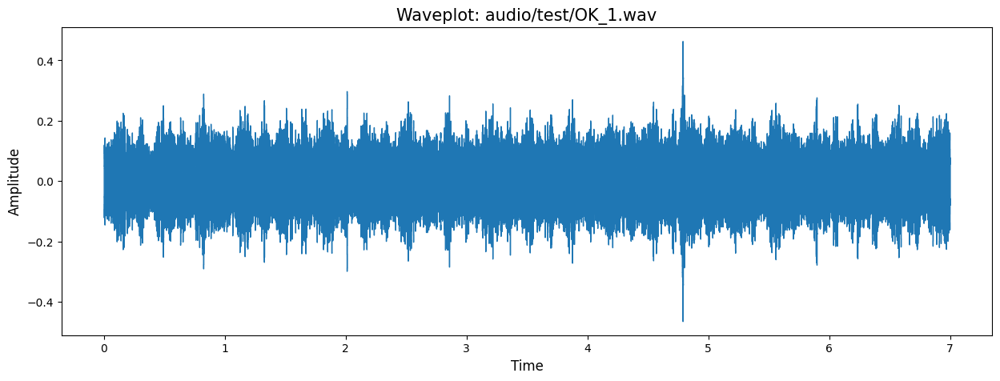

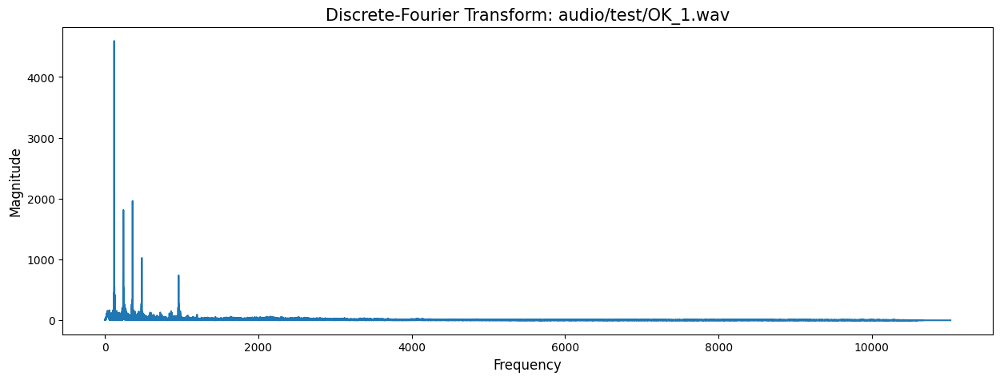

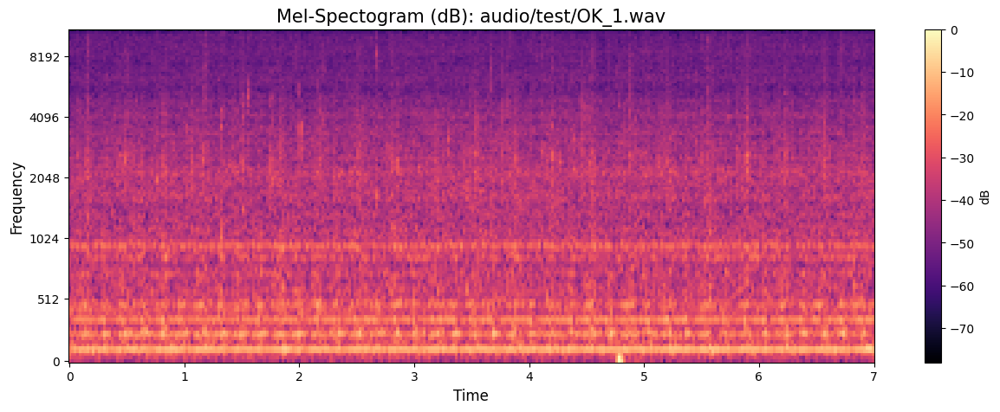

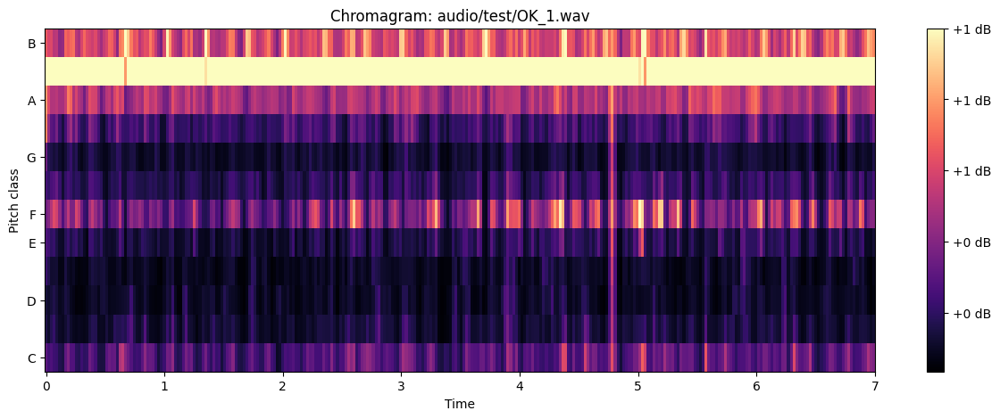

In [51]:
get_audio_metadata(sound)
display_amplitude(sound)
display_fft(sound)
display_mel_spectogram(sound)
display_chromagram(sound)

In [52]:
topnlist = find_similar_sound(sound, topn=10)

Finding similar audio file of audio/test/OK_1.wav using audio embeddings and Azure Cognitive Search

Top 01: audio/train/no_anomaly/machine_sound_15.wav        | category: no_anomaly      | score = 0.98374486
Top 02: audio/train/no_anomaly/machine_sound_06.wav        | category: no_anomaly      | score = 0.9809513
Top 03: audio/train/no_anomaly/machine_sound_14.wav        | category: no_anomaly      | score = 0.978749
Top 04: audio/train/anomaly/machine_sound_109.wav          | category: anomaly         | score = 0.9779524
Top 05: audio/train/no_anomaly/machine_sound_07.wav        | category: no_anomaly      | score = 0.97709227
Top 06: audio/train/no_anomaly/machine_sound_27.wav        | category: no_anomaly      | score = 0.97704893
Top 07: audio/train/no_anomaly/machine_sound_28.wav        | category: no_anomaly      | score = 0.976591
Top 08: audio/train/no_anomaly/machine_sound_45.wav        | category: no_anomaly      | score = 0.97516125
Top 09: audio/train/no_anomaly/machine_so

In [53]:
sound = os.path.join(TEST_DIR, testlist[3])
sound

'audio/test/OK_2.wav'

In [54]:
Audio(sound, autoplay=False)


 -------------------- Audio Statistics -------------------- 

Audio File:	 audio/test/OK_2.wav
Modified Date:	 Mon Jul 17 17:49:18 2023
Creation Date:	 Tue Jul 18 08:11:12 2023
File Size:	 1234844
Audio Format:	 WAVEAudioFormat.PCM
Bit Depth:	 16
Bit Rate:	 1411200
Sampling Rate:	 44100
Nb of Channels:	 2
Duration:	 7.0


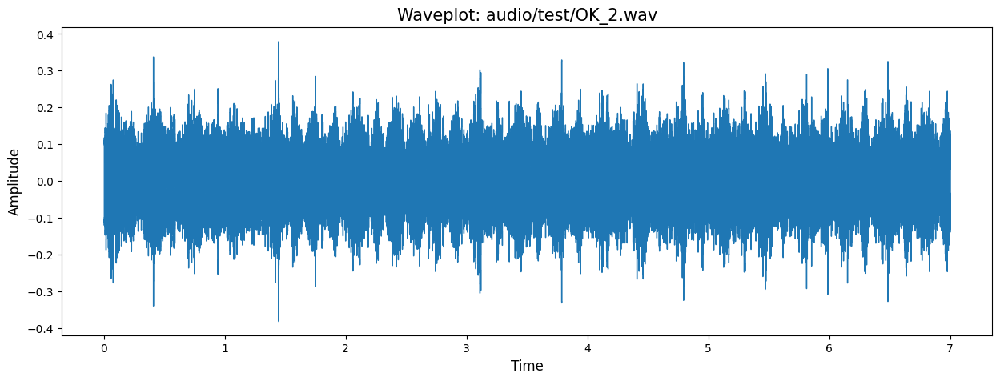

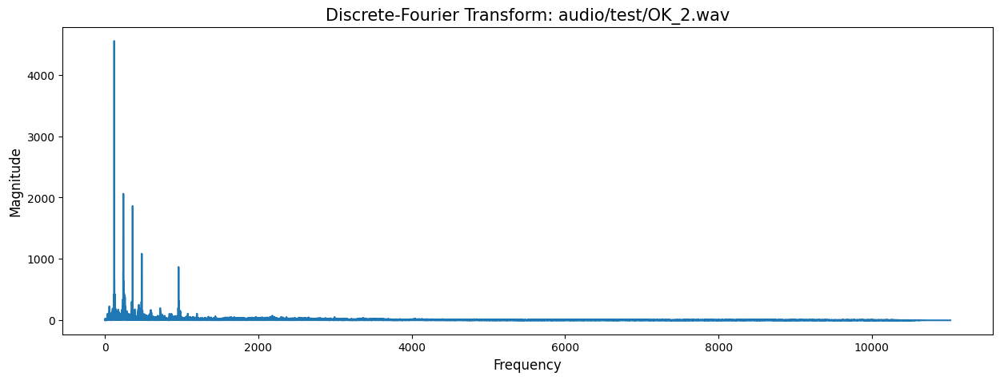

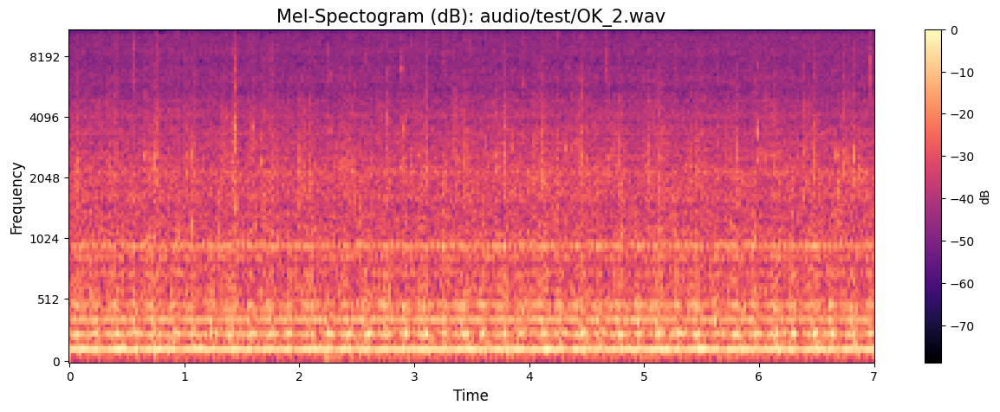

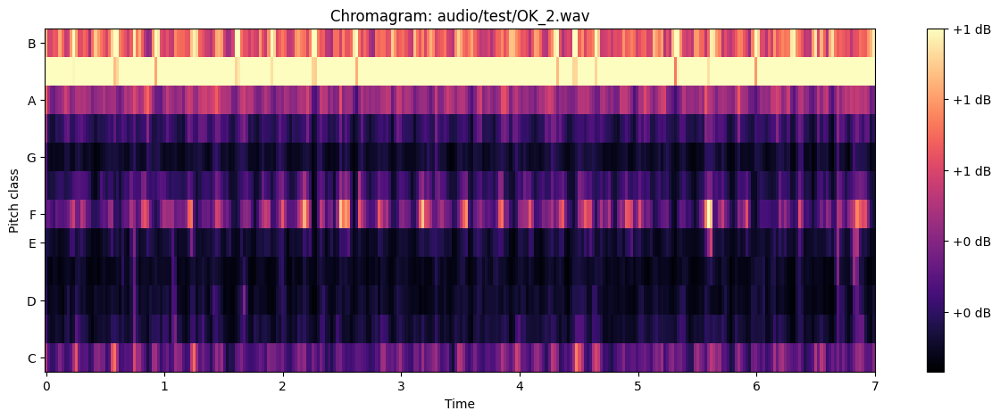

In [55]:
get_audio_metadata(sound)
display_amplitude(sound)
display_fft(sound)
display_mel_spectogram(sound)
display_chromagram(sound)

In [56]:
topnlist = find_similar_sound(sound, topn=10)

Finding similar audio file of audio/test/OK_2.wav using audio embeddings and Azure Cognitive Search

Top 01: audio/train/anomaly/machine_sound_109.wav          | category: anomaly         | score = 0.98710877
Top 02: audio/train/no_anomaly/machine_sound_10.wav        | category: no_anomaly      | score = 0.9835277
Top 03: audio/train/no_anomaly/machine_sound_36.wav        | category: no_anomaly      | score = 0.97887236
Top 04: audio/train/no_anomaly/machine_sound_12.wav        | category: no_anomaly      | score = 0.9785422
Top 05: audio/train/no_anomaly/machine_sound_28.wav        | category: no_anomaly      | score = 0.97841233
Top 06: audio/train/no_anomaly/machine_sound_26.wav        | category: no_anomaly      | score = 0.97819144
Top 07: audio/train/no_anomaly/machine_sound_01.wav        | category: no_anomaly      | score = 0.97775126
Top 08: audio/train/anomaly/machine_sound_102.wav          | category: anomaly         | score = 0.9777209
Top 09: audio/train/no_anomaly/machine

### Analyzing sounds with anomalies

In [57]:
sound = os.path.join(TEST_DIR, testlist[0])
sound

'audio/test/KO_1.wav'

In [58]:
Audio(sound, autoplay=False)


 -------------------- Audio Statistics -------------------- 

Audio File:	 audio/test/KO_1.wav
Modified Date:	 Mon Jul 17 17:48:46 2023
Creation Date:	 Tue Jul 18 08:11:12 2023
File Size:	 1234844
Audio Format:	 WAVEAudioFormat.PCM
Bit Depth:	 16
Bit Rate:	 1411200
Sampling Rate:	 44100
Nb of Channels:	 2
Duration:	 7.0


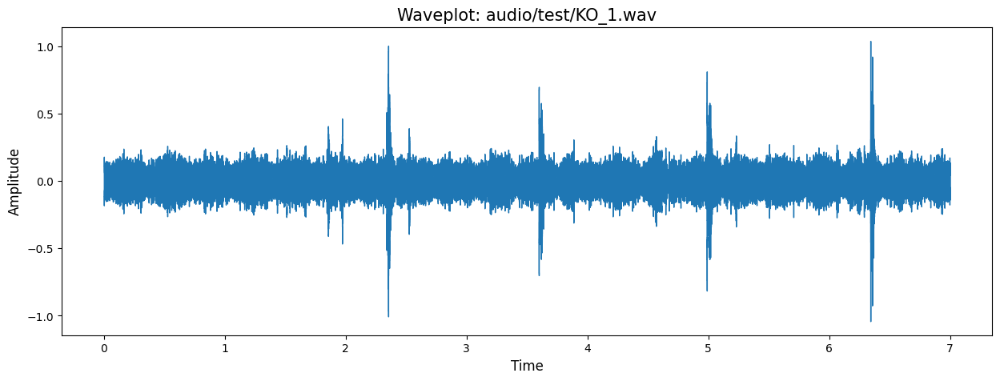

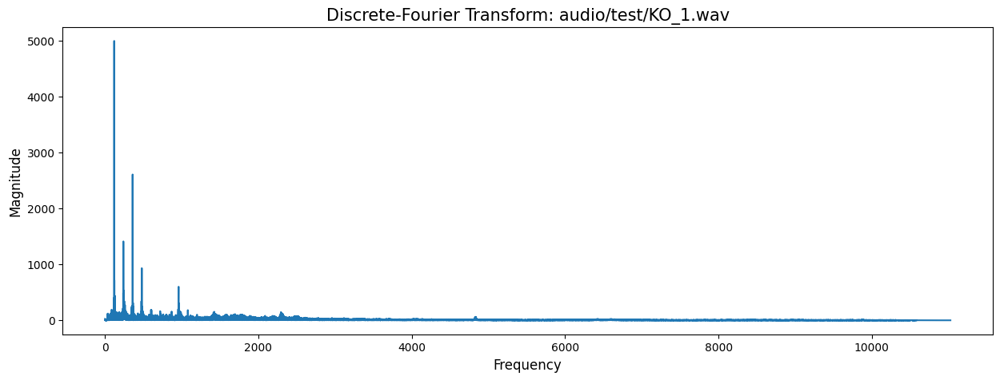

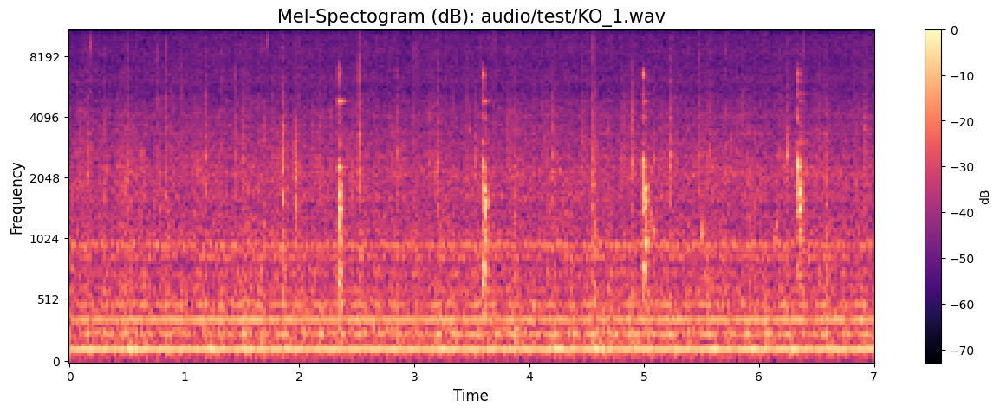

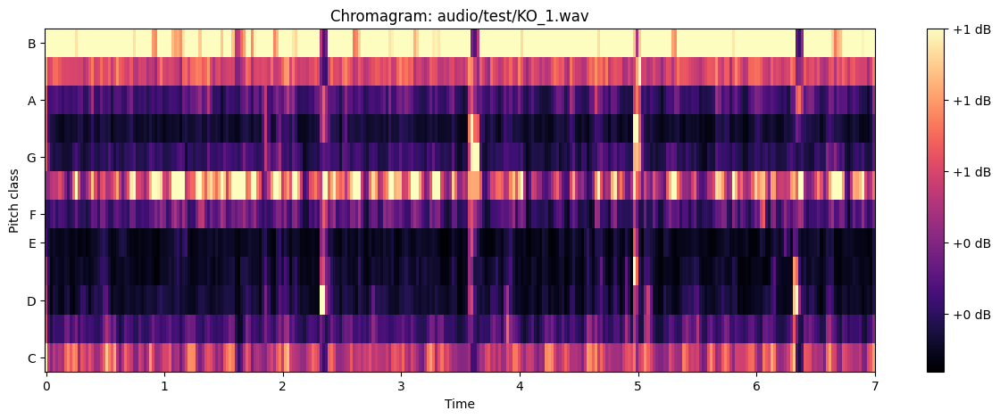

In [59]:
get_audio_metadata(sound)
display_amplitude(sound)
display_fft(sound)
display_mel_spectogram(sound)
display_chromagram(sound)

In [60]:
topnlist = find_similar_sound(sound, topn=10)

Finding similar audio file of audio/test/KO_1.wav using audio embeddings and Azure Cognitive Search

Top 01: audio/train/anomaly/machine_sound_124.wav          | category: anomaly         | score = 0.9636872
Top 02: audio/train/anomaly/machine_sound_107.wav          | category: anomaly         | score = 0.9571552
Top 03: audio/train/anomaly/machine_sound_108.wav          | category: anomaly         | score = 0.9568583
Top 04: audio/train/anomaly/machine_sound_101.wav          | category: anomaly         | score = 0.9544763
Top 05: audio/train/anomaly/machine_sound_106.wav          | category: anomaly         | score = 0.95302695
Top 06: audio/train/anomaly/machine_sound_147.wav          | category: anomaly         | score = 0.95071864
Top 07: audio/train/anomaly/machine_sound_119.wav          | category: anomaly         | score = 0.948871
Top 08: audio/train/anomaly/machine_sound_115.wav          | category: anomaly         | score = 0.948023
Top 09: audio/train/anomaly/machine_sound_1

In [61]:
sound = os.path.join(TEST_DIR, testlist[1])
sound

'audio/test/KO_2.wav'

In [62]:
Audio(sound, autoplay=False)


 -------------------- Audio Statistics -------------------- 

Audio File:	 audio/test/KO_2.wav
Modified Date:	 Mon Jul 17 17:48:46 2023
Creation Date:	 Tue Jul 18 08:11:12 2023
File Size:	 1234844
Audio Format:	 WAVEAudioFormat.PCM
Bit Depth:	 16
Bit Rate:	 1411200
Sampling Rate:	 44100
Nb of Channels:	 2
Duration:	 7.0


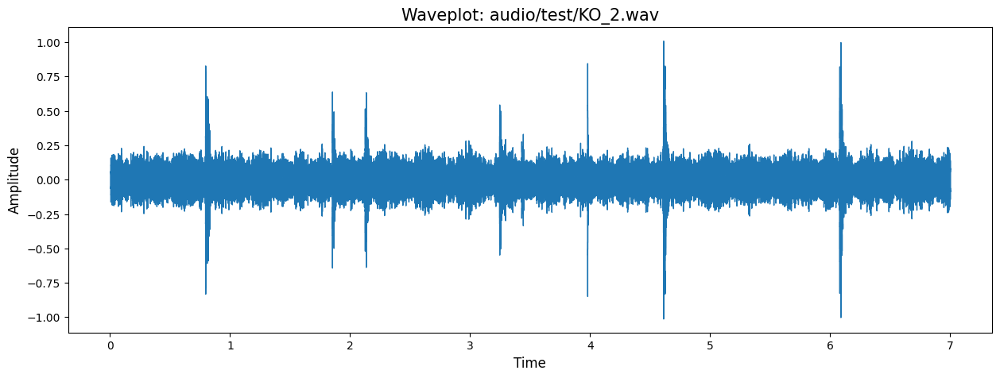

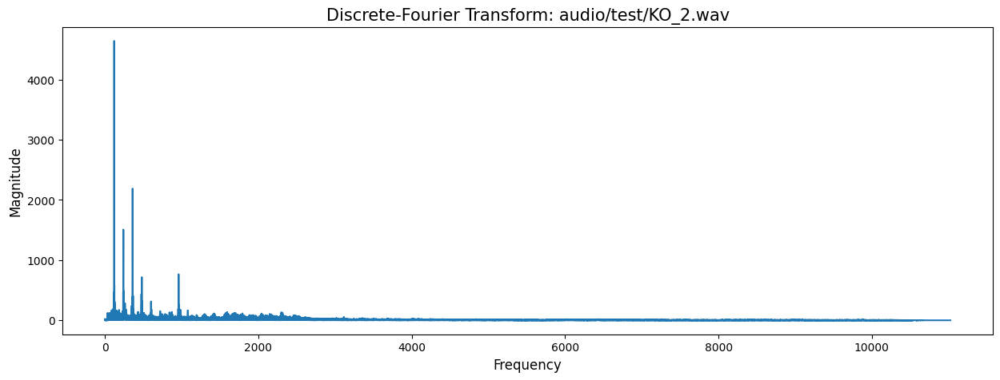

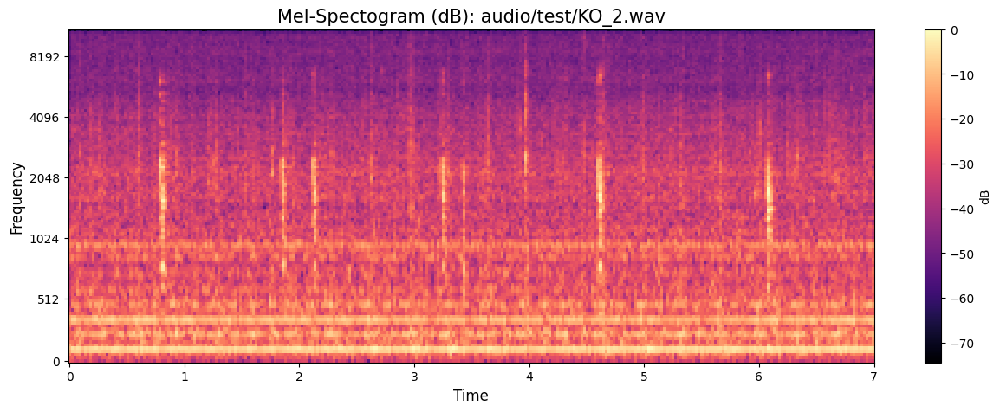

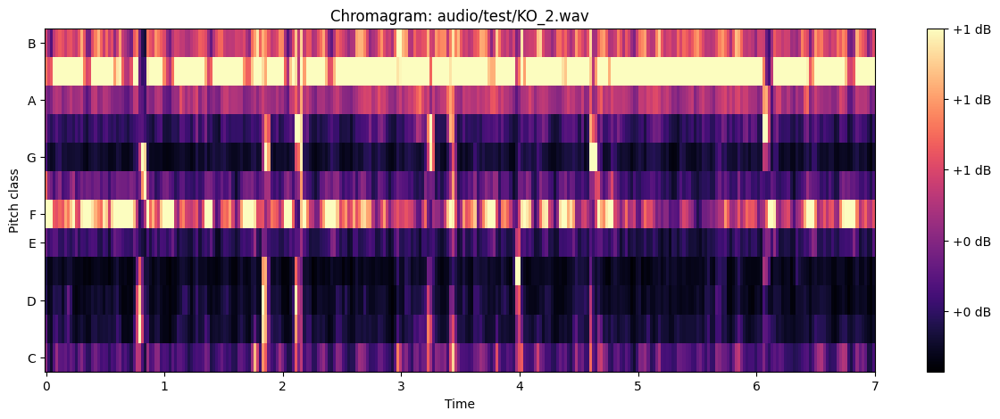

In [63]:
get_audio_metadata(sound)
display_amplitude(sound)
display_fft(sound)
display_mel_spectogram(sound)
display_chromagram(sound)

In [64]:
topnlist = find_similar_sound(sound, topn=10)

Finding similar audio file of audio/test/KO_2.wav using audio embeddings and Azure Cognitive Search

Top 01: audio/train/anomaly/machine_sound_108.wav          | category: anomaly         | score = 0.97288954
Top 02: audio/train/anomaly/machine_sound_101.wav          | category: anomaly         | score = 0.96519053
Top 03: audio/train/anomaly/machine_sound_117.wav          | category: anomaly         | score = 0.9577212
Top 04: audio/train/anomaly/machine_sound_114.wav          | category: anomaly         | score = 0.94809264
Top 05: audio/train/anomaly/machine_sound_157.wav          | category: anomaly         | score = 0.9475683
Top 06: audio/train/anomaly/machine_sound_112.wav          | category: anomaly         | score = 0.945889
Top 07: audio/train/anomaly/machine_sound_113.wav          | category: anomaly         | score = 0.94453245
Top 08: audio/train/anomaly/machine_sound_136.wav          | category: anomaly         | score = 0.9444495
Top 09: audio/train/anomaly/machine_soun

## 8. Post Processing

We can delete the Azure Cognitive Search index if needed

In [67]:
index_status(index_name)

Azure Cognitive Search Index: azure-audioanomaly-embeddings-demo 


{
     "@odata.context": "https://azurecogsearcheastussr.search.windows.net/$metadata#indexes/$entity",
     "@odata.etag": "\"0x8DB87707E32D4BF\"",
     "name": "azure-audioanomaly-embeddings-demo",
     "defaultScoringProfile": null,
     "fields": [
          {
               "name": "id_audiofile",
               "type": "Edm.String",
               "searchable": false,
               "filterable": false,
               "retrievable": true,
               "sortable": false,
               "facetable": false,
               "key": true,
               "indexAnalyzer": null,
               "searchAnalyzer": null,
               "analyzer": null,
               "normalizer": null,
               "synonymMaps": []
          },
          {
               "name": "audio_filename",
               "type": "Edm.String",
               "searchable": true,
               "filterable": false,
               "retrievable": true

In [68]:
delete_index(index_name)

Deleting the Azure Cognitive Search index: azure-audioanomaly-embeddings-demo
Done. Elapsed time: 0.57 secs


In [69]:
index_status(index_name)

Azure Cognitive Search Index: azure-audioanomaly-embeddings-demo 


{
     "error": {
          "code": "",
          "message": "No index with the name 'azure-audioanomaly-embeddings-demo' was found in the service 'azurecogsearcheastussr'."
     }
}
